In [1]:
import cloudpickle

#pikls_pikl = "pikls/20260204_105425/all_datasets_full.pkl"

pikl_paths = [
    ("TTJetsDiLept_2016UL",     "pikls/20260206_110901/TTJetsDiLept2016UL.pkl"),
    ("TTJetsDiLept_2016UL_FS",  "pikls/20260206_110901/TTJetsDiLept2016ULFS.pkl"),
    ("TTJetsDiLept_2017UL",     "pikls/20260206_110901/TTJetsDiLept2017UL.pkl"),
    ("TTJetsDiLept_2017UL_FS",  "pikls/20260206_110901/TTJetsDiLept2017ULFS.pkl"),
    ("TTJetsDiLept_2018UL",     "pikls/20260206_110901/TTJetsDiLept2018UL.pkl"),
    ("TTJetsDiLept_2018UL_FS",  "pikls/20260206_110901/TTJetsDiLept2018ULFS.pkl"),
    ("TTto2L2Nu-3Jets_2022",    "pikls/20260206_110901/TTto2L2Nu-3Jets2022.pkl"),
    ("TTto2L2Nu-3Jets_2022_FS", "pikls/20260206_110901/TTto2L2Nu-3JetsFS2022.pkl")
]

# Option 1: Store in a dictionary
pikls = {}
for name, path in pikl_paths:
    with open(path, "rb") as f:
        pikls[name] = cloudpickle.load(f)['result']

In [2]:
pikls.keys()

dict_keys(['TTJetsDiLept_2016UL', 'TTJetsDiLept_2016UL_FS', 'TTJetsDiLept_2017UL', 'TTJetsDiLept_2017UL_FS', 'TTJetsDiLept_2018UL', 'TTJetsDiLept_2018UL_FS', 'TTto2L2Nu-3Jets_2022', 'TTto2L2Nu-3Jets_2022_FS'])

In [3]:
pikls[list(pikls.keys())[0]].keys()

dict_keys(['ele_hist', 'muon_hist'])

In [4]:
pikls[list(pikls.keys())[0]]["ele_hist"]

Hist(
  Variable([2, 3, 4, 5, 7, 10, 20, 45, 75, 1000], name='pt', label='Electron $p_T$ (GeV)'),
  Regular(300, 0, 300, name='pt_long', label='Electron $p_T$ (GeV)'),
  Regular(50, 0, 2.5, name='eta_long', label='Electron $\\eta$'),
  Variable([0, 0.8, 1.4442, 1.556, 2.5], name='eta', label='Electron $\\eta$'),
  IntCategory([-10, 1, 10, 100, 1000], name='gen', label='Electron Gen Tag'),
  IntCategory([-1, 1, 10, 100], name='qual', label='Electron Quality Tag'),
  storage=Double()) # Sum: 21767868.0 (23908982.0 with flow)

In [5]:
from plotting.pt_eta_eff import plot_eta_pt_eff
from plotting.pt_eff_gsb import make_1d_pt_eff_comparison, make_1d_pt_eff_ratio

In [6]:
import matplotlib.pyplot as plt
import mplhep

In [7]:
make_ele_1d_eff = True
make_mu_1d_eff  = True

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:179: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(25, 12))


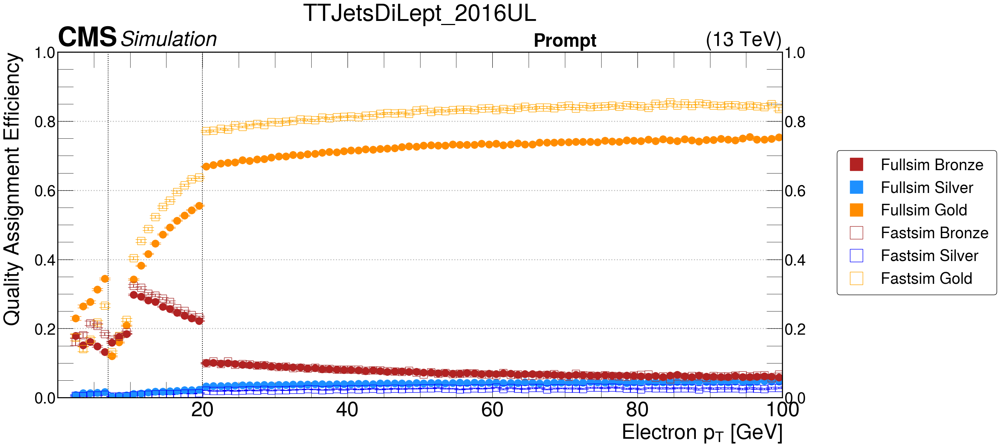

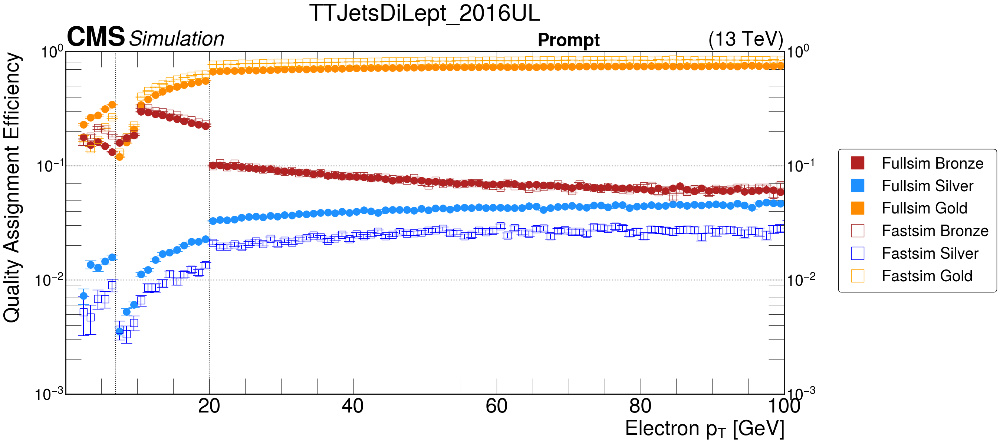

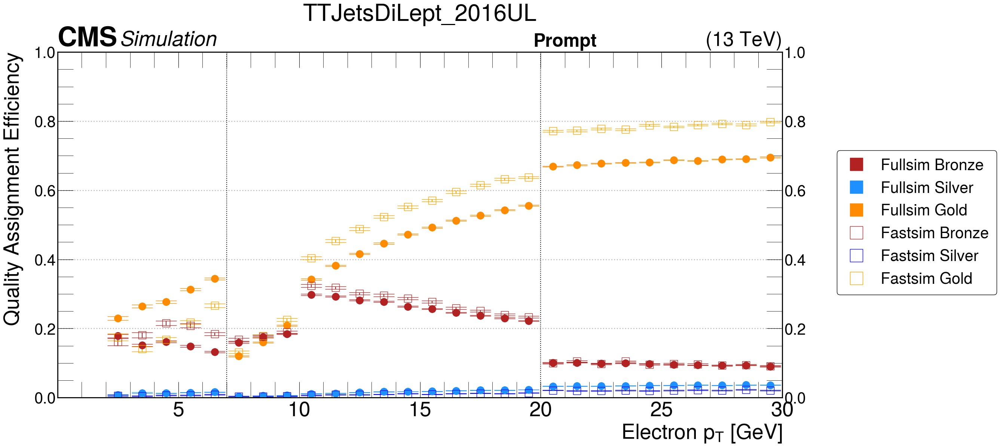

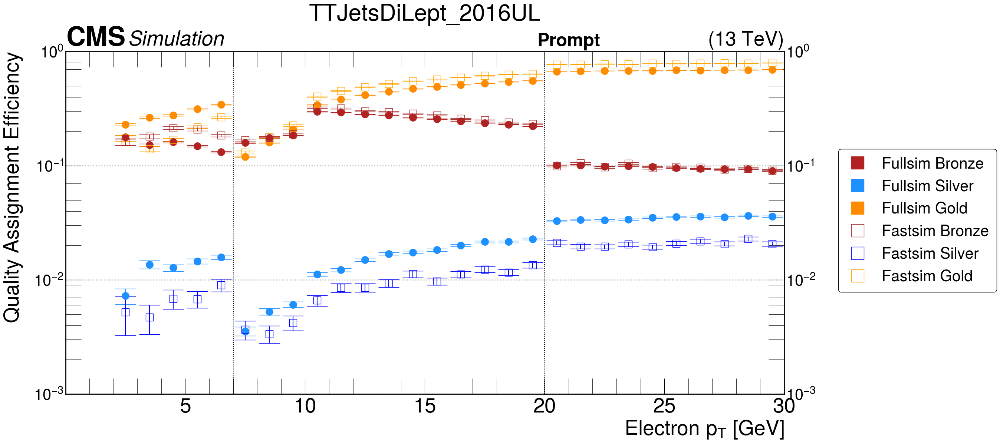

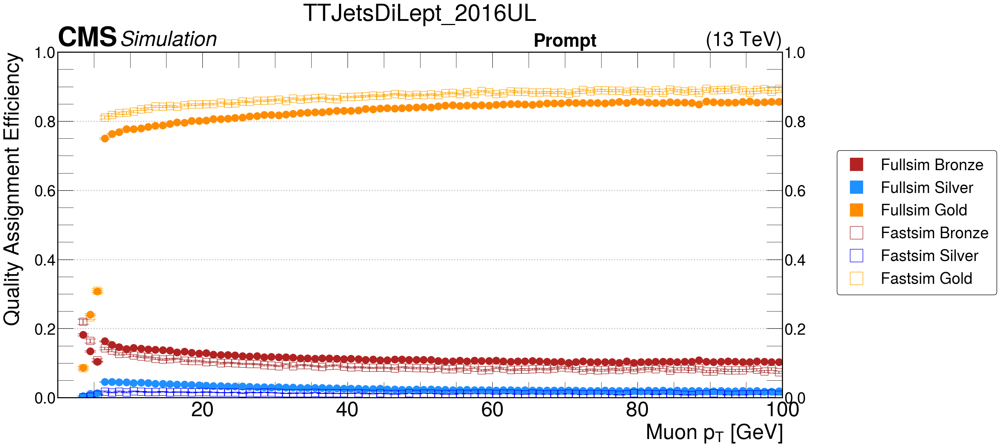

...

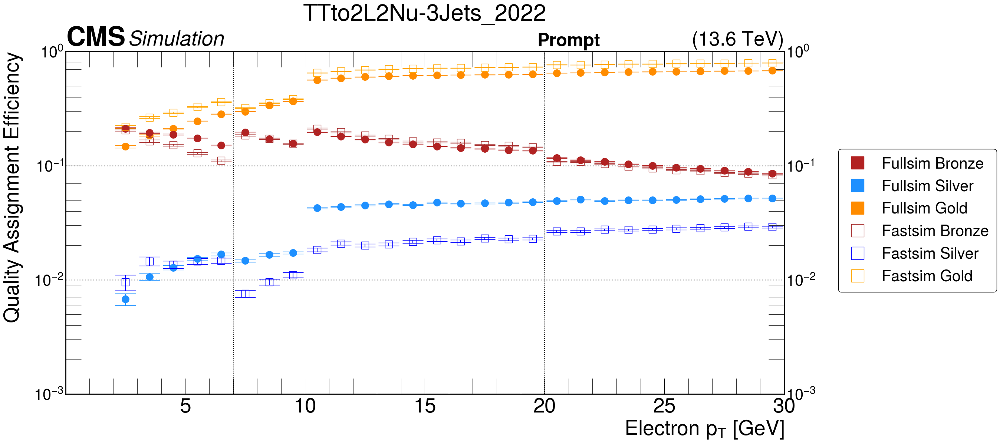

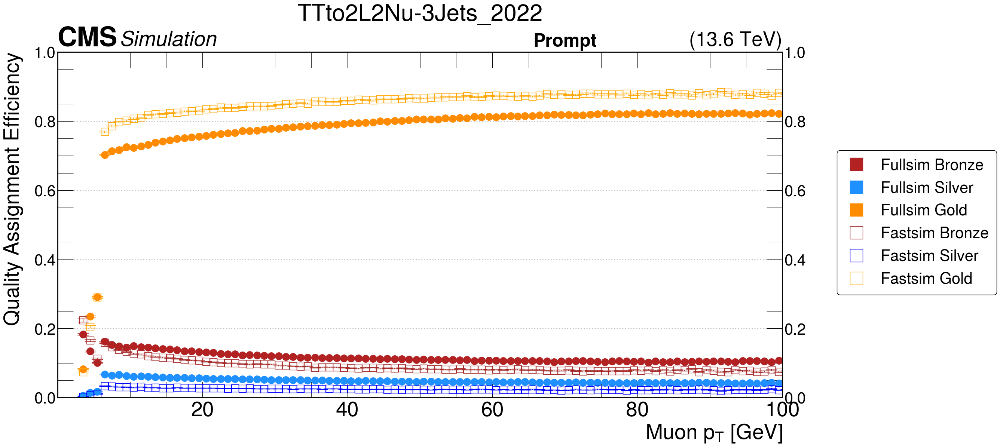

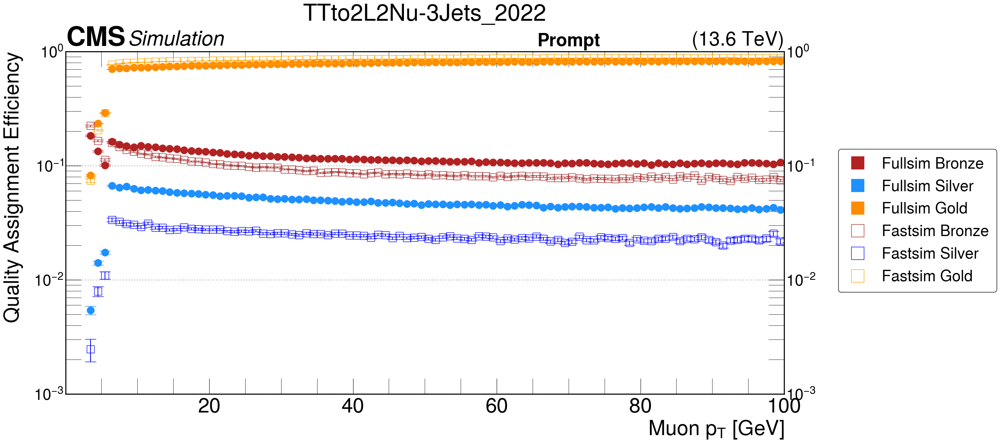

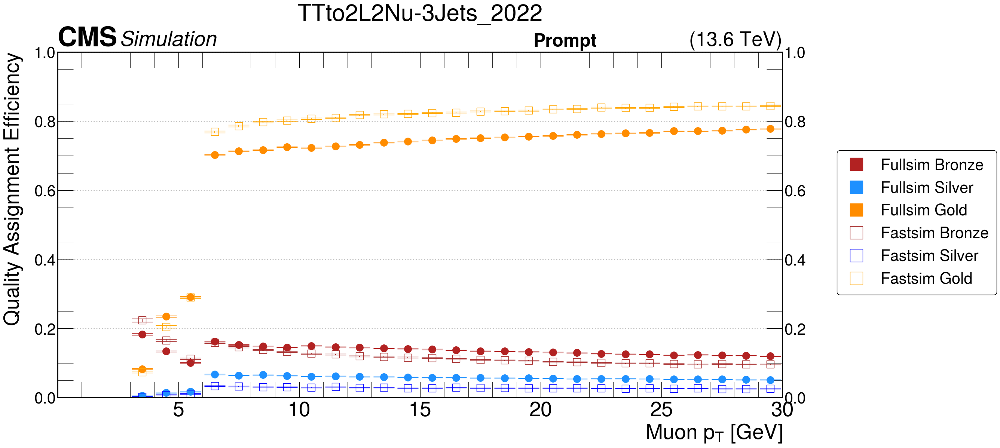

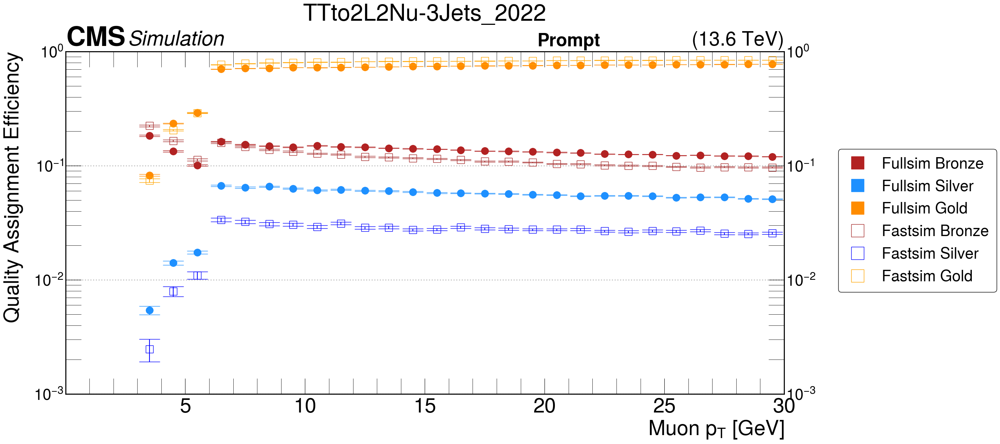

In [59]:
pairs = [
    ("TTJetsDiLept_2016UL", "TTJetsDiLept_2016UL_FS"),
    ("TTJetsDiLept_2017UL", "TTJetsDiLept_2017UL_FS"),
    ("TTJetsDiLept_2018UL", "TTJetsDiLept_2018UL_FS"), 
    ("TTto2L2Nu-3Jets_2022", "TTto2L2Nu-3Jets_2022_FS")]

for pair in pairs:

    gen_pairs = [(1j, "Prompt")]
                 #, (10j, "LightFake"), (100j, "HeavyFake"),]
    
    if make_ele_1d_eff:
        for gen_pair in gen_pairs:

            fullsim = pikls[pair[0]]['ele_hist']
            fastsim = pikls[pair[1]]['ele_hist']

            year = 2000
            com=13

            if  "2016UL" in pair[0]:
                year = "2016UL"
            if  "2017UL" in pair[0]:
                year = "2017UL"
            if  "2018UL" in pair[0]:
                year = "2018UL"
            if  "2022" in pair[0]:
                com = 13.6
                year = "2022"

                
        
            # 1. Regular (linear, up to 100 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Electron",
                com=com,
            )
            
            # 2. Regular log (log scale, up to 100 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Electron",
                com=com,
                log_scale=True
            )
            
            # 3. Regular up to 30 GeV (linear, up to 30 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Electron",
                com=com,
                max_pt=30,
                cap_size = 20
            )
            
            # 4. Log 30 GeV (log scale, up to 30 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Electron",
                com=com,
                max_pt=30,
                log_scale=True,
                cap_size = 20
            )


            #Muon here #######
            if make_mu_1d_eff:
                
                fullsim = pikls[pair[0]]['muon_hist']
                fastsim = pikls[pair[1]]['muon_hist']
    
                make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Muon",
                com=com,
            )
            
            # 2. Regular log (log scale, up to 100 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Muon",
                com=com,
                log_scale=True
            )
            
            # 3. Regular up to 30 GeV (linear, up to 30 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Muon",
                com=com,
                max_pt=30,
                cap_size = 20
            )
            
            # 4. Log 30 GeV (log scale, up to 30 GeV)
            make_1d_pt_eff_comparison(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lepton_type="Muon",
                com=com,
                max_pt=30,
                log_scale=True,
                cap_size = 20
            )

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


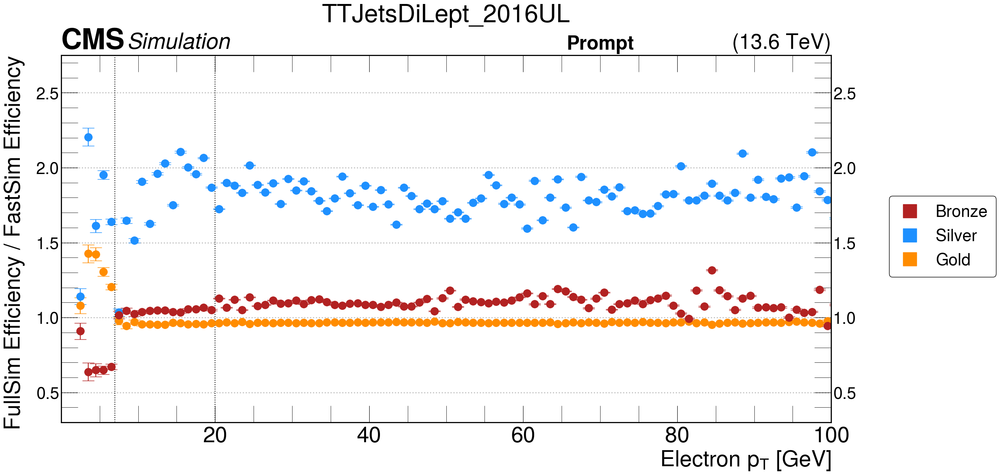

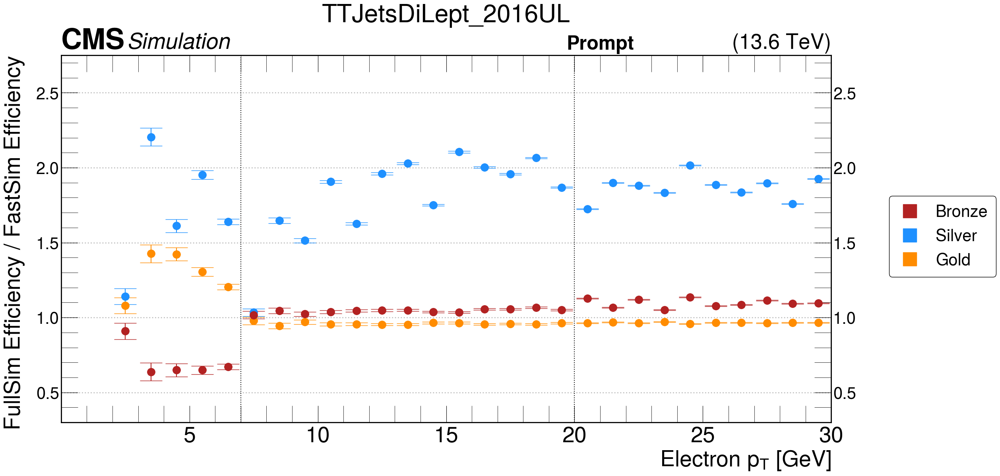

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: invalid value encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:485: RuntimeWarning: invalid value encountered in divide
  (err1 / eff1)**2 +
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: invalid value encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:485: RuntimeWarning: invalid value encountered in divide
  (err1 / eff1)**2 +
/home/cms-jovyan/dwg_framework/src/plotting/

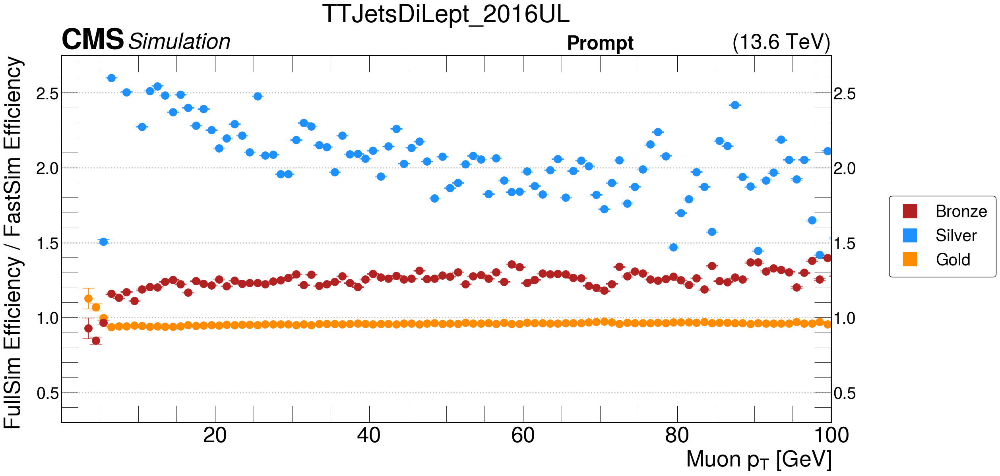

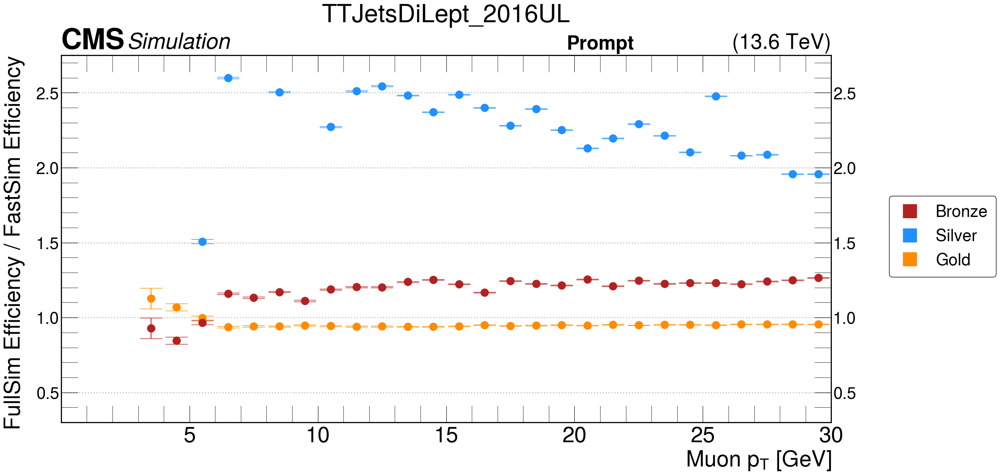

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


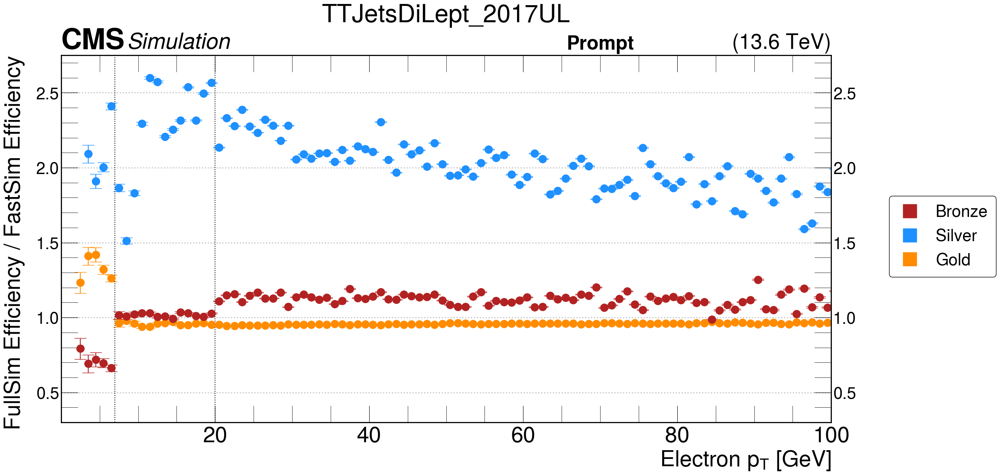

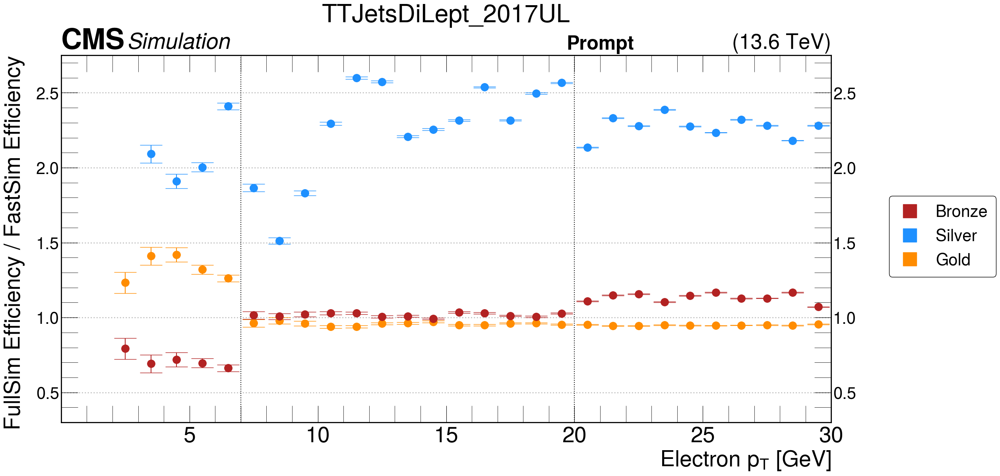

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


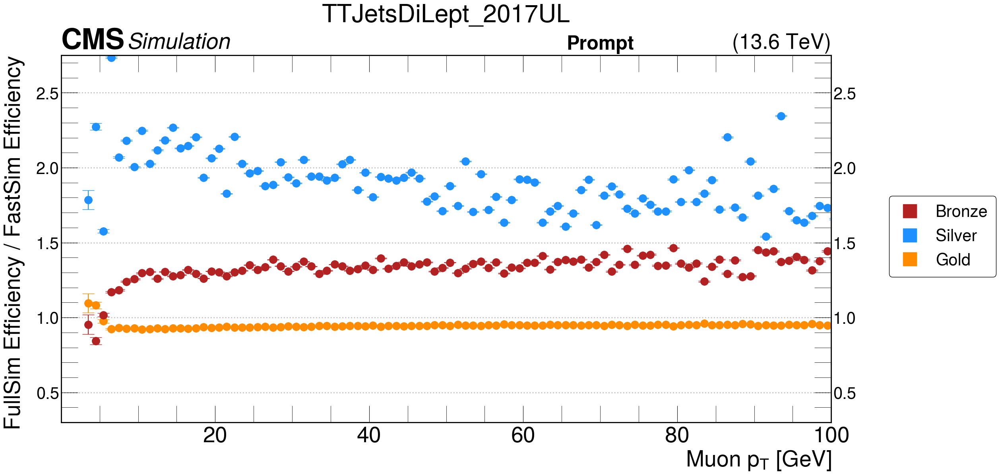

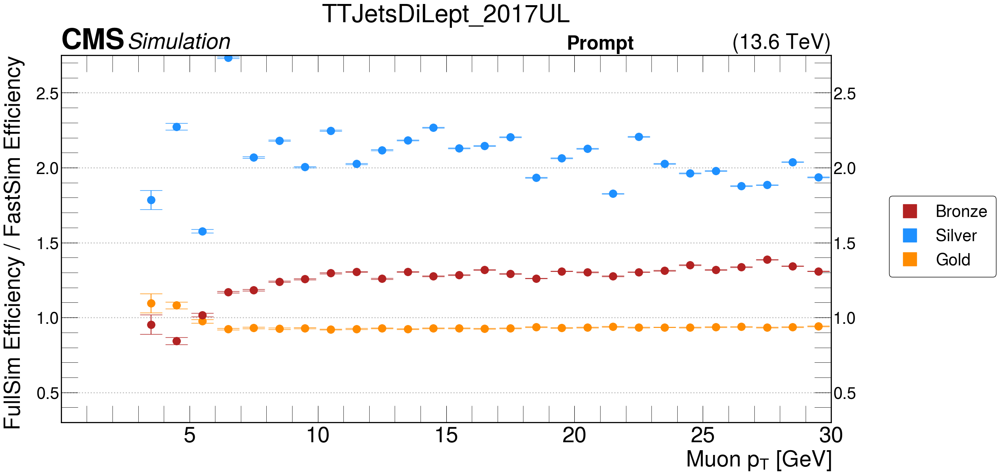

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


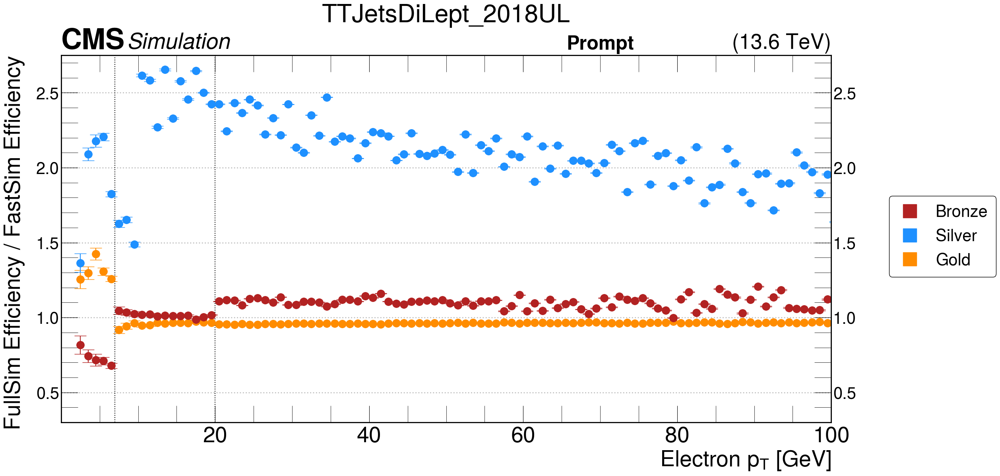

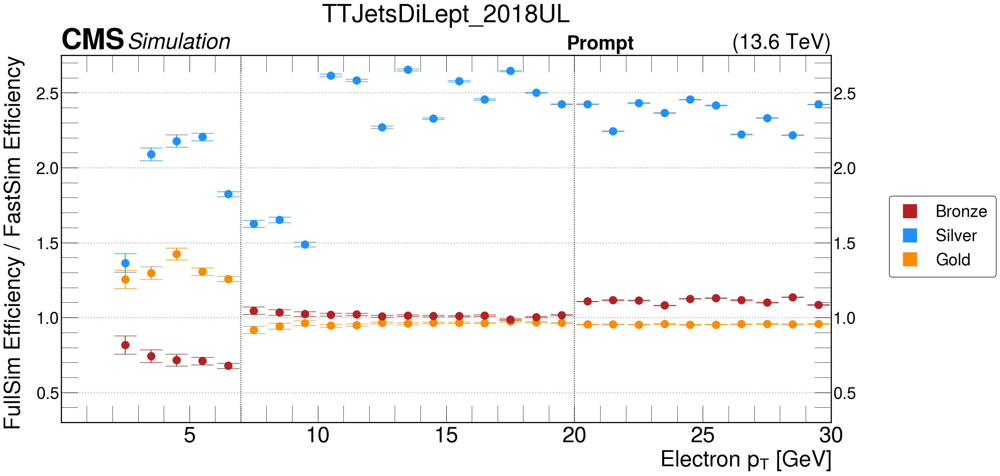

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


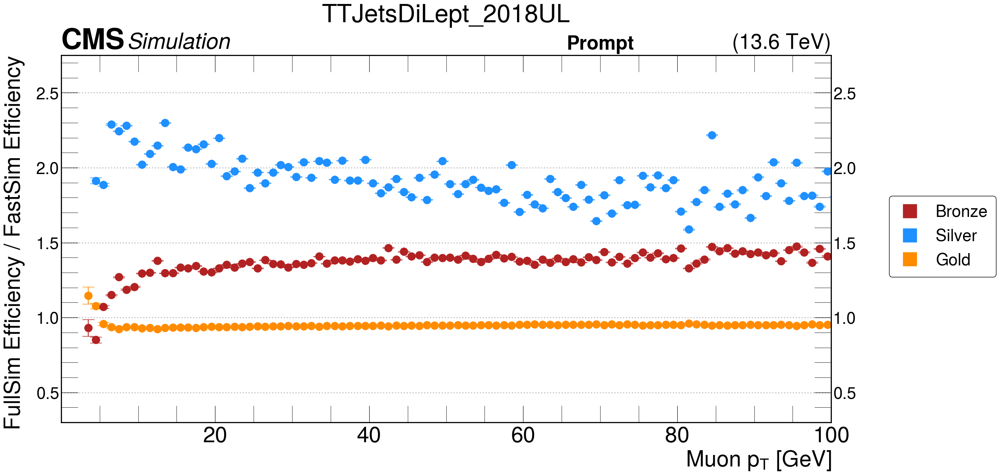

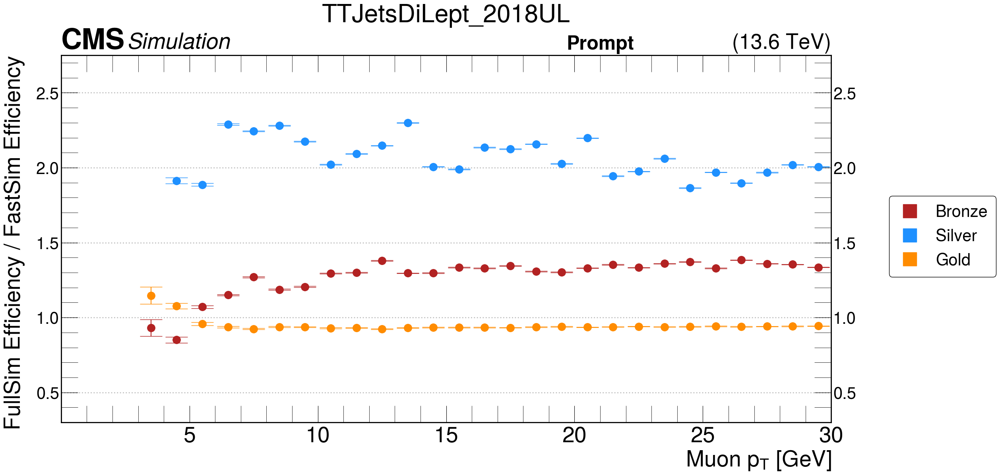

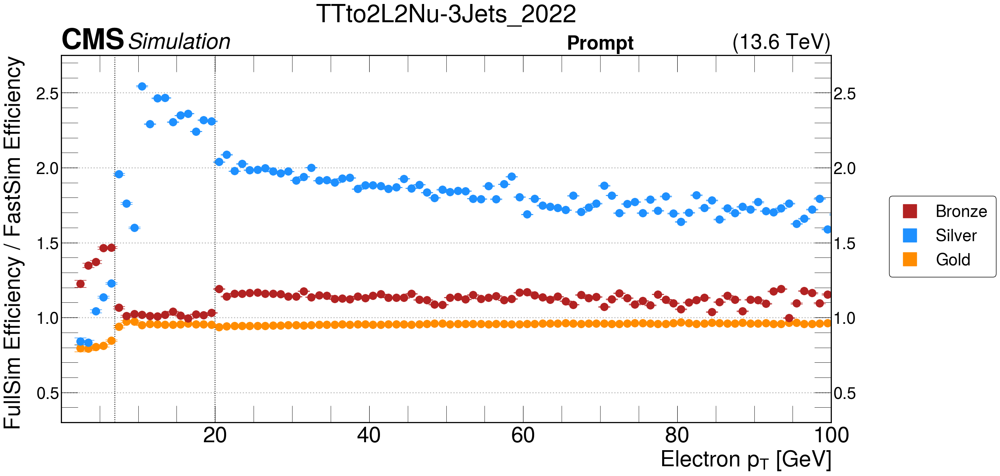

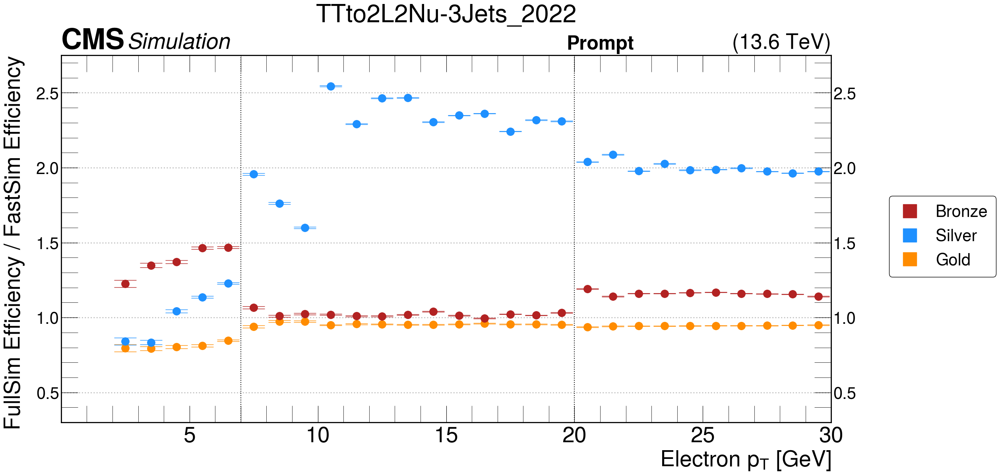

/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:482: RuntimeWarning: divide by zero encountered in divide
  ratio = eff1 / eff2
/home/cms-jovyan/dwg_framework/src/plotting/pt_eff_gsb.py:486: RuntimeWarning: invalid value encountered in divide
  (err2 / eff2)**2


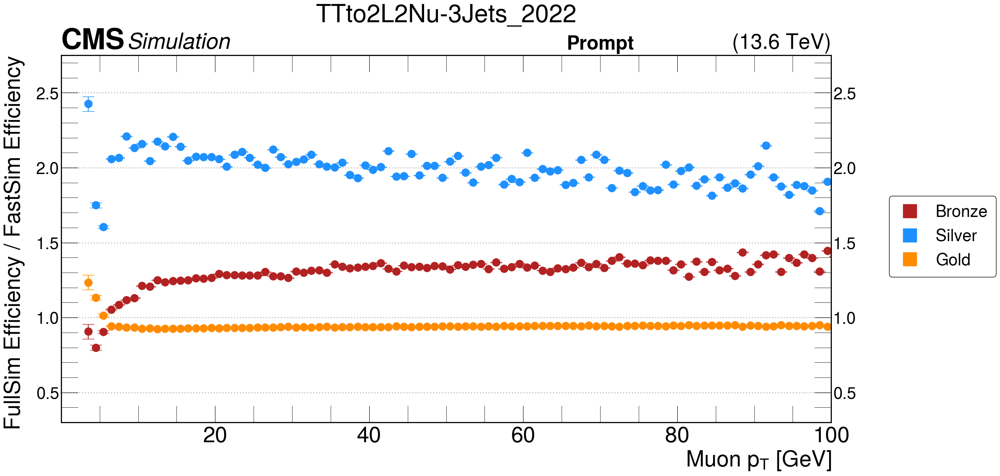

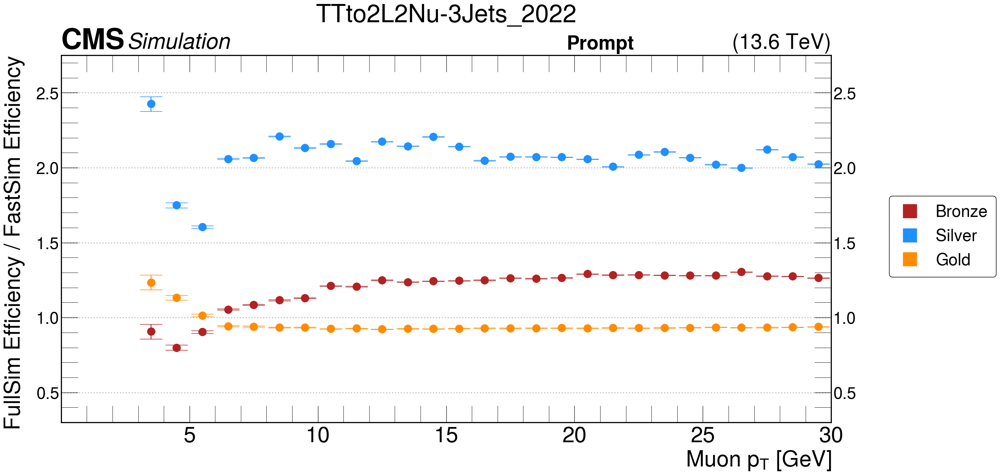

In [63]:
pairs = [
    ("TTJetsDiLept_2016UL", "TTJetsDiLept_2016UL_FS"),
    ("TTJetsDiLept_2017UL", "TTJetsDiLept_2017UL_FS"),
    ("TTJetsDiLept_2018UL", "TTJetsDiLept_2018UL_FS"), 
    ("TTto2L2Nu-3Jets_2022", "TTto2L2Nu-3Jets_2022_FS")]

for pair in pairs:

    gen_pairs = [(1j, "Prompt")]
                 #, (10j, "LightFake"), (100j, "HeavyFake"),]
    
    if make_ele_1d_eff:
        for gen_pair in gen_pairs:

            fullsim = pikls[pair[0]]['ele_hist']
            fastsim = pikls[pair[1]]['ele_hist']

            year = 2000
            com=13

            if  "2016UL" in pair[0]:
                year = "2016UL"
            if  "2017UL" in pair[0]:
                year = "2017UL"
            if  "2018UL" in pair[0]:
                year = "2018UL"
            if  "2022" in pair[0]:
                com = 13.6
                year = "2022"


        for gen_pair in gen_pairs:
            
            test = make_1d_pt_eff_ratio(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lep_type="Electron",
                com=13.6
            )
        
            test2 = make_1d_pt_eff_ratio(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_ele",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lep_type="Electron",
                max_pt=30,
                com=13.6,
                cap_size = 20
            )

            display(test.figure)
            display(test2.figure)

            fullsim = pikls[pair[0]]['muon_hist']
            fastsim = pikls[pair[1]]['muon_hist']

            test = make_1d_pt_eff_ratio(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lep_type="Muon",
                com=13.6
            )
        
            test2 = make_1d_pt_eff_ratio(
                hist1=fullsim[:, :, :, :, gen_pair[0], :],
                hist2=fastsim[:, :, :, :, gen_pair[0], :],
                name=f"{pair[0]}_{pair[1]}_{gen_pair[1]}_muon",
                title=rf"{pair[0]}",
                plot_txt=gen_pair[1],
                savefig=True,
                lep_type="Muon",
                max_pt=30,
                com=13.6,
                cap_size = 20
            )

            display(test.figure)
            display(test2.figure)

In [12]:
pikls['TTJetsDiLept_2016UL']['ele_hist'].integrate('pt').integrate('eta')

Hist(
  Regular(300, 0, 300, name='pt_long', label='Electron $p_T$ (GeV)'),
  Regular(50, 0, 2.5, name='eta_long', label='Electron $\\eta$'),
  IntCategory([-10, 1, 10, 100, 1000], name='gen', label='Electron Gen Tag'),
  IntCategory([-1, 1, 10, 100], name='qual', label='Electron Quality Tag'),
  storage=Double()) # Sum: 23039582.0 (23908982.0 with flow)

In [66]:
def get_2d_long_eff(hist, qual):

    int_hist = hist.integrate('pt').integrate('eta').integrate('gen', [1j])

    if qual == 'gold':
        hist_num = int_hist.integrate('qual', [100j])
    if qual == 'silver':
        hist_num = int_hist.integrate('qual', [10j])
    if qual == 'bronze':
        hist_num = int_hist.integrate('qual', [1j])

    denom_hist = int_hist.integrate('qual')

    eff_hist = hist_num / denom_hist

    return eff_hist

def make_2d_ratio(hist_1, hist_2, qual, lep_type, title, save_name, com=13):

    hist1_eff = get_2d_long_eff(hist_1, qual)
    hist2_eff = get_2d_long_eff(hist_2, qual)

    ratio = hist1_eff / hist2_eff
    
    fig, ax = plt.subplots(figsize=(20, 16))
    mplhep.style.use(mplhep.style.CMS)
    
    mplhep.cms.label(loc=0, fontsize=30, com=com)
    #mplhep.cms.text("Work in Progress", fontsize=40, loc=0)
    plt.ylabel(fr"{lep_type} $|\eta|$", fontsize=40)
    plt.xlabel(fr"{lep_type} $p_T$ (GeV)", fontsize=40)

    plt.title(title, pad=50, fontweight="bold")

    ratio.plot()

    plt.savefig(f"plots/{save_name}.pdf")
    plt.show()
    

In [32]:
TTJetsDiLept_2016UL = pikls['TTJetsDiLept_2016UL']['ele_hist']

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x7f9c643ad220>, cbar=<matplotlib.colorbar.Colorbar object at 0x7f9c642c6c90>, text=[])

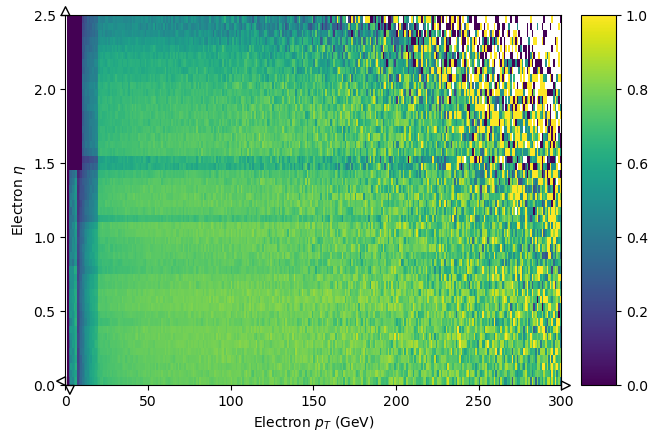

In [20]:
TTJetsDiLept_2016UL.plot()

In [33]:
TTJetsDiLept_2016UL_FS = pikls['TTJetsDiLept_2016UL_FS']['ele_hist']

ColormeshArtists(pcolormesh=<matplotlib.collections.QuadMesh object at 0x7f9c641f26c0>, cbar=<matplotlib.colorbar.Colorbar object at 0x7f9c509d4b60>, text=[])

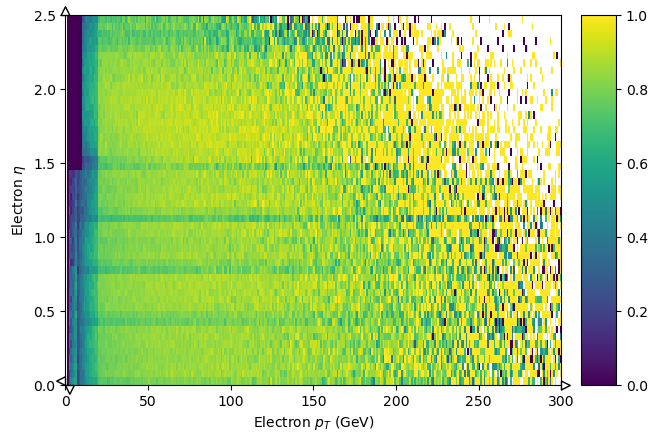

In [23]:
TTJetsDiLept_2016UL_FS.plot()

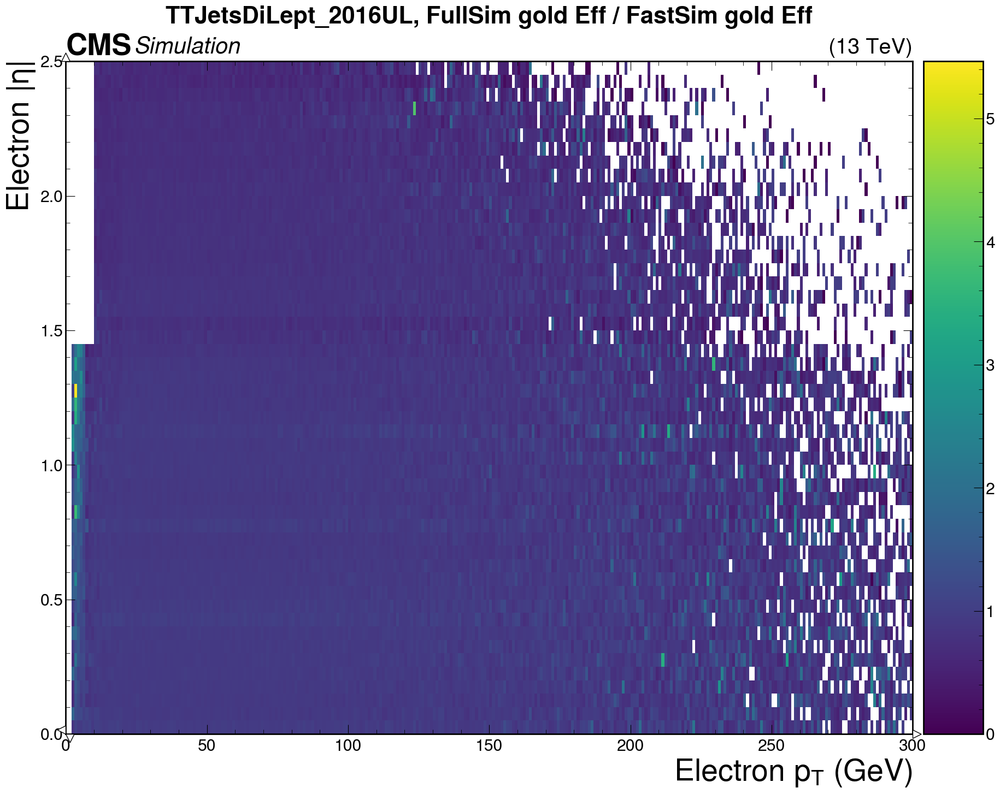

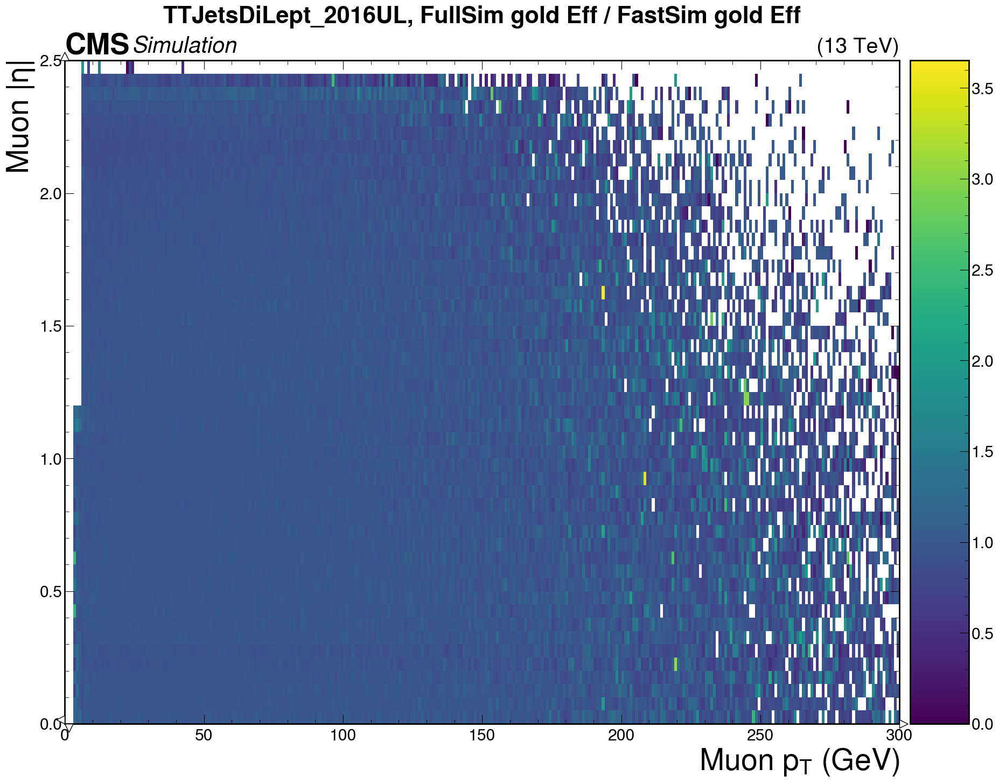

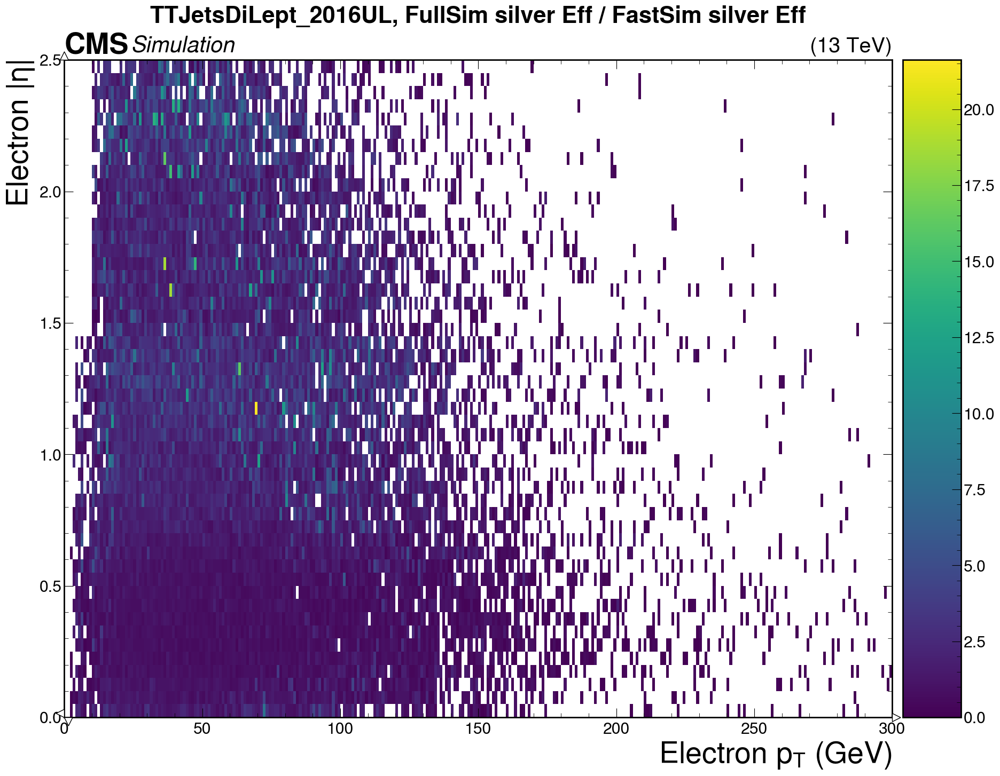

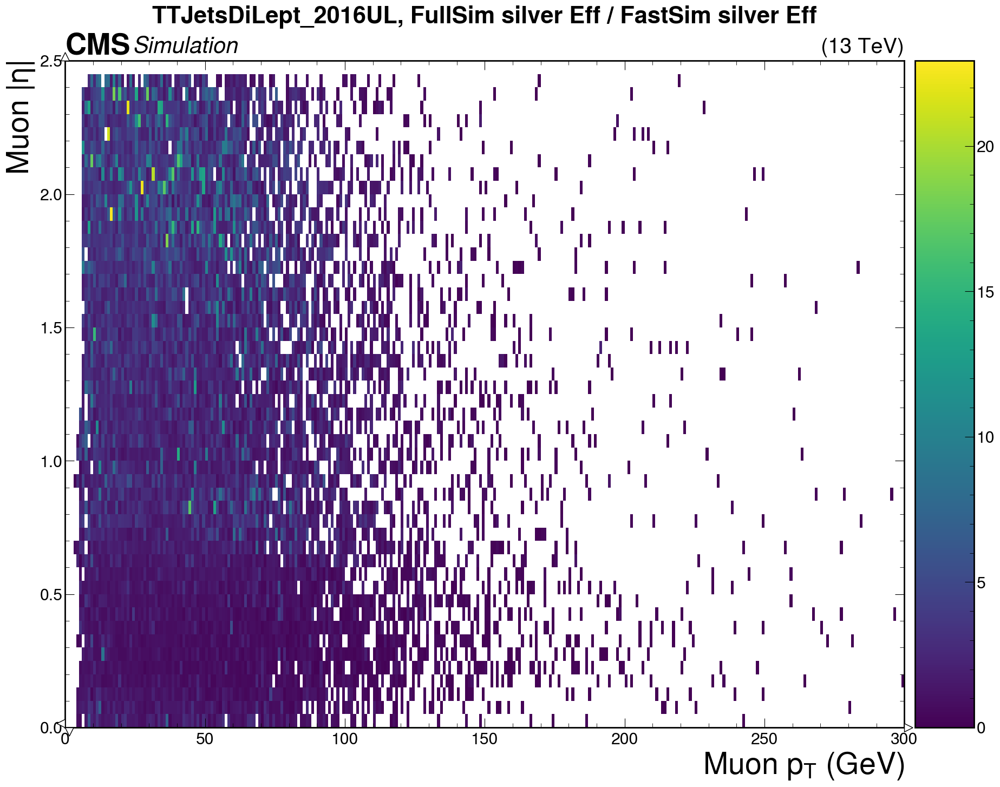

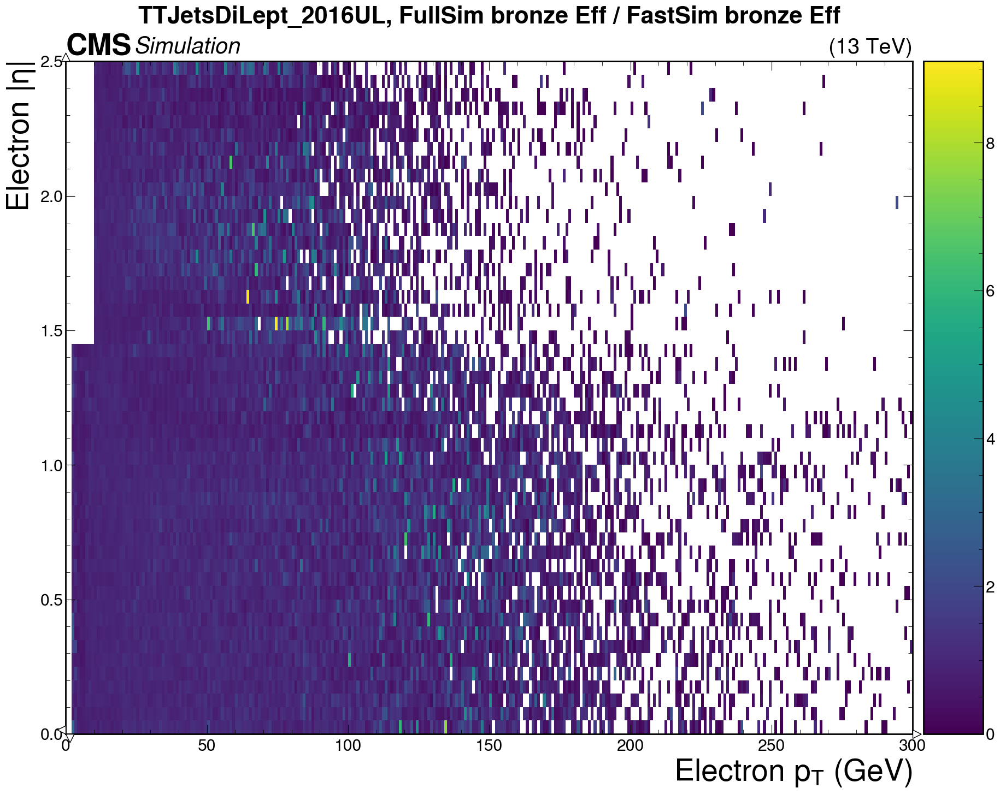

...

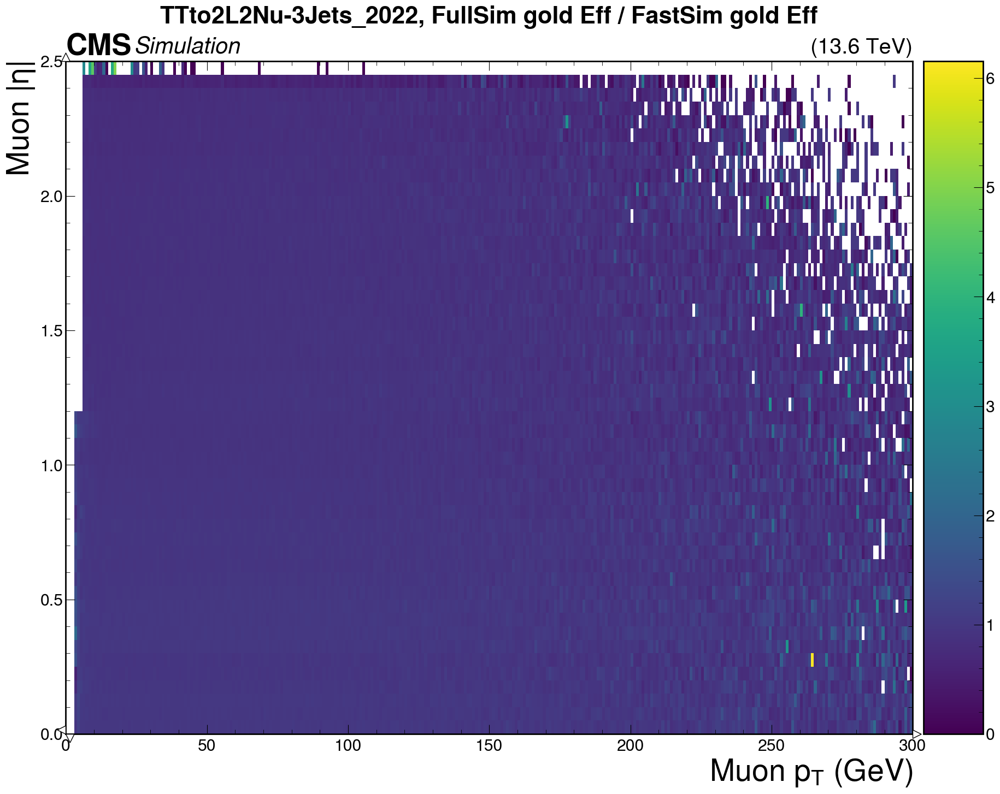

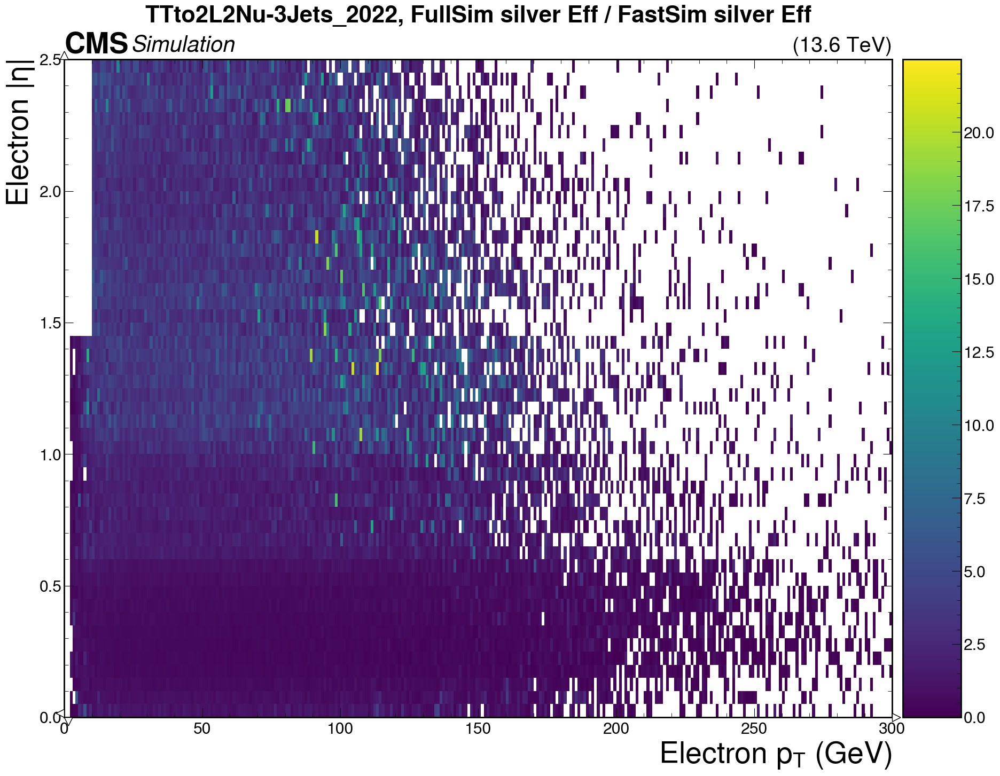

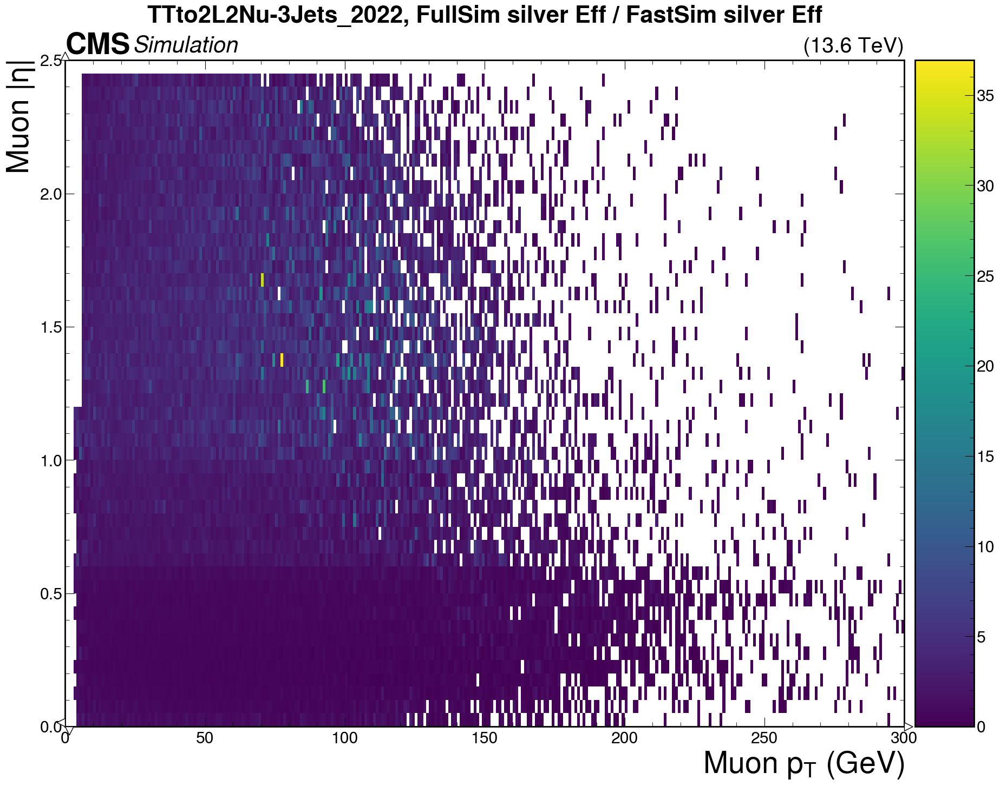

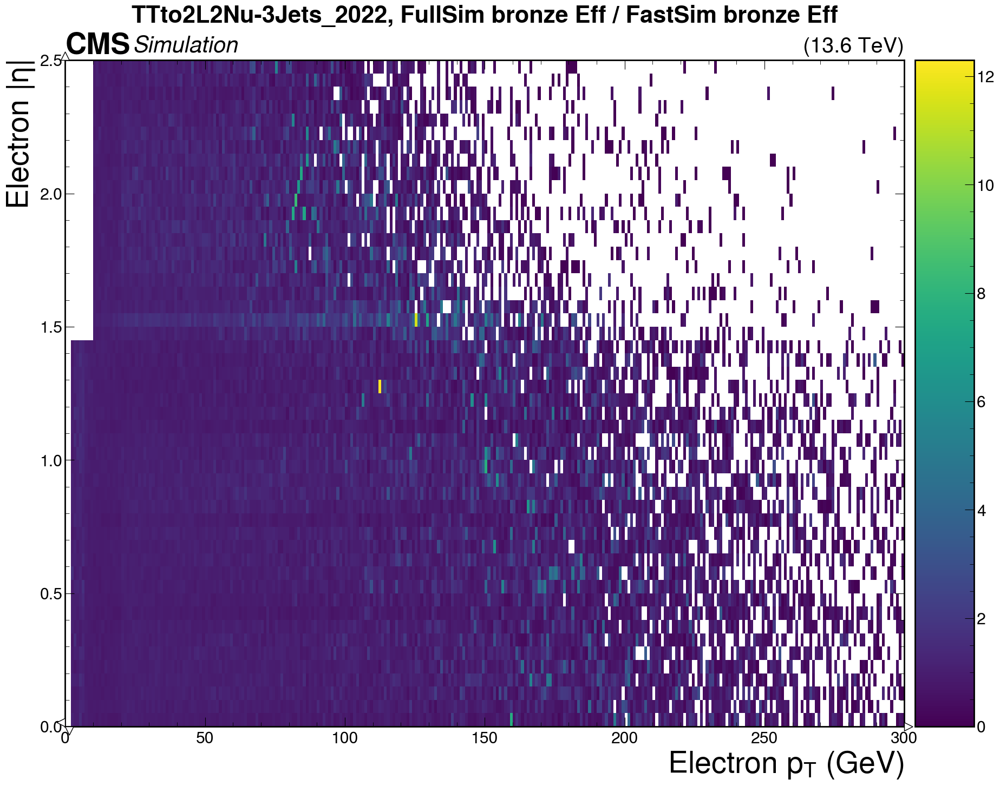

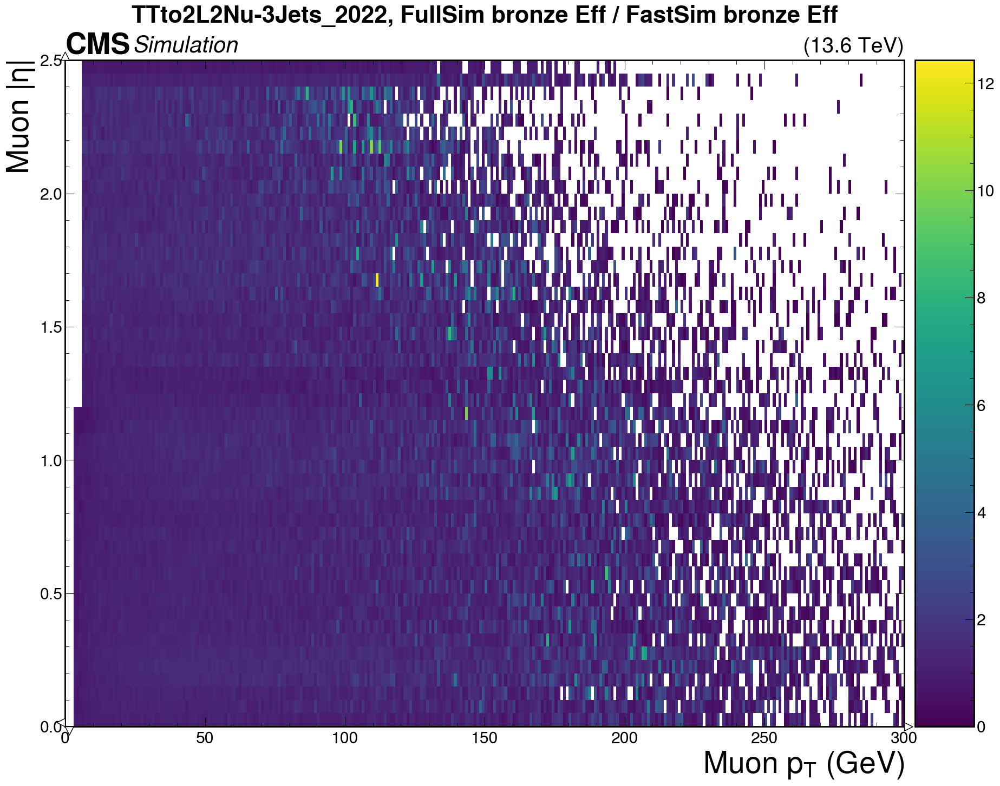

In [71]:
pairs = [
    ("TTJetsDiLept_2016UL", "TTJetsDiLept_2016UL_FS"),
    ("TTJetsDiLept_2017UL", "TTJetsDiLept_2017UL_FS"),
    ("TTJetsDiLept_2018UL", "TTJetsDiLept_2018UL_FS"), 
    ("TTto2L2Nu-3Jets_2022", "TTto2L2Nu-3Jets_2022_FS")]

quals = ["gold", "silver", "bronze"]

for pair in pairs:

    gen_pairs = [(1j, "Prompt")]#, (10j, "LightFake"), (100j, "HeavyFake"),]
    
    if make_ele_1d_eff:
        for qual in quals:
            for gen_pair in gen_pairs:
    
                fullsim_ele = pikls[pair[0]]['ele_hist']
                fastsim_ele = pikls[pair[1]]['ele_hist']
    
                fullsim_muon = pikls[pair[0]]['muon_hist']
                fastsim_muon = pikls[pair[1]]['muon_hist']
    
                year = 2000
                com=13
    
                if  "2016UL" in pair[0]:
                    year = "2016UL"
                if  "2017UL" in pair[0]:
                    year = "2017UL"
                if  "2018UL" in pair[0]:
                    year = "2018UL"
                if  "2022" in pair[0]:
                    com = 13.6
                    year = "2022"
    
            make_2d_ratio(
                fullsim_ele,
                fastsim_ele,
                qual=qual,
                title=f"{pair[0]}, FullSim {qual} Eff / FastSim {qual} Eff", 
                lep_type="Electron",
                save_name=f"twod_eff_ratio_{pair[0]}_{qual}_ele",
                com=com)
            
            make_2d_ratio(
                fullsim_muon,
                fastsim_muon,
                qual=qual,
                title=f"{pair[0]}, FullSim {qual} Eff / FastSim {qual} Eff", 
                lep_type="Muon",
                save_name=f"twod_eff_ratio_{pair[0]}_{qual}_muon",
                com=com)